## Applied_Data_Science_Capstone-week4-Capstone_Project

### Import libraries:

In [1]:
import numpy as np 
import pandas as pd 
import seaborn as sns

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
              
!conda install -c conda-forge geopy --yes 
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values
              
!conda install -c conda-forge folium=0.12.0 --yes 
import folium # map rendering library
              
import requests # library to handle requests       
              
# import k-means from clustering stage
from sklearn.cluster import KMeans
              
# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt
%matplotlib inline 

!pip install yellowbrick
# Import ElbowVisualizer
from yellowbrick.cluster import KElbowVisualizer

Solving environment: ...working... done

# All requested packages already installed.

Solving environment: ...working... done

# All requested packages already installed.



### Download bay area zip codes csv file from https://catalog.data.gov/dataset/bay-area-zip-codes:

In [2]:
path='D:/bayarea_zipcodes.csv'
bay_geom=pd.read_csv(path)
bay_geom.head()

,PO_NAME,the_geom,ZIP,STATE,Area__,Length__
0,NAPA,MULTIPOLYGON (((-122.10329200180091 38.5132829...,94558,CA,1.231326e+10,995176.225313
1,FAIRFIELD,MULTIPOLYGON (((-121.947475002335 38.301511000...,94533,CA,9.917861e+08,200772.556587
2,DIXON,MULTIPOLYGON (((-121.65335500334429 38.3133870...,95620,CA,7.236950e+09,441860.201400
3,SONOMA,MULTIPOLYGON (((-122.406843003057 38.155681999...,95476,CA,3.001414e+09,311318.546326
4,NAPA,MULTIPOLYGON (((-122.29368500225117 38.1552379...,94559,CA,1.194302e+09,359104.646602


### Obtain the zip codes and area name, rename the columns.

In [3]:
bay_geom=bay_geom[['ZIP','PO_NAME','Area__']]
bay_geom=bay_geom.rename(columns={'ZIP':'ZipCode','PO_NAME':'City','Area__':'Area'})
bay_geom.head()

,ZipCode,City,Area
0,94558,NAPA,1.231326e+10
1,94533,FAIRFIELD,9.917861e+08
2,95620,DIXON,7.236950e+09
3,95476,SONOMA,3.001414e+09
4,94559,NAPA,1.194302e+09


### Get the data of all the zip codes in CA, then merge with data of bay area.

In [4]:
urls=['http://zipatlas.com/us/ca/zip-code-comparison/population-density.htm',
     'http://zipatlas.com/us/ca/zip-code-comparison/population-density.2.htm',
     'http://zipatlas.com/us/ca/zip-code-comparison/population-density.3.htm',
     'http://zipatlas.com/us/ca/zip-code-comparison/population-density.4.htm',
     'http://zipatlas.com/us/ca/zip-code-comparison/population-density.5.htm',
     'http://zipatlas.com/us/ca/zip-code-comparison/population-density.6.htm',
     'http://zipatlas.com/us/ca/zip-code-comparison/population-density.7.htm',
     'http://zipatlas.com/us/ca/zip-code-comparison/population-density.8.htm',
     'http://zipatlas.com/us/ca/zip-code-comparison/population-density.9.htm',
     'http://zipatlas.com/us/ca/zip-code-comparison/population-density.10.htm',
     'http://zipatlas.com/us/ca/zip-code-comparison/population-density.11.htm',
     'http://zipatlas.com/us/ca/zip-code-comparison/population-density.12.htm',
     'http://zipatlas.com/us/ca/zip-code-comparison/population-density.13.htm',
     'http://zipatlas.com/us/ca/zip-code-comparison/population-density.14.htm',
     'http://zipatlas.com/us/ca/zip-code-comparison/population-density.15.htm',
     'http://zipatlas.com/us/ca/zip-code-comparison/population-density.16.htm',
     'http://zipatlas.com/us/ca/zip-code-comparison/population-density.17.htm'
    ]

cadata=pd.DataFrame()
for url in urls:
    cadata=cadata.append(pd.read_html(url,header=0)[10].drop(['#'], axis=1), ignore_index=True)

cadata=cadata.rename(columns={'Zip Code':'ZipCode'})    
cadata.head()

,ZipCode,Location,City,Population,People / Sq. Mile,National Rank
0,94108,"37.791998, -122.408653","San Francisco, California",13716,53134.47,#48
1,90057,"34.061918, -118.277939","Los Angeles, California",43986,49226.28,#54
2,94109,"37.794487, -122.422270","San Francisco, California",56322,46521.46,#64
3,94102,"37.779500, -122.419233","San Francisco, California",28991,44719.24,#71
4,94133,"37.802071, -122.411004","San Francisco, California",26827,40117.97,#77


### Use pandas.merge to add latitude, longitude, and population to the bay area dataframe.

In [5]:
bay_data=pd.merge(bay_geom.drop('City', axis=1), cadata, on='ZipCode')
bay_data.head()

,ZipCode,Area,Location,City,Population,People / Sq. Mile,National Rank
0,94558,1.231326e+10,"38.489789, -122.270110","Napa, California",63932,155.68,"#12,064"
1,94533,9.917861e+08,"38.287136, -122.027110","Fairfield, California",77666,2290.55,"#4,040"
2,95620,7.236950e+09,"38.392821, -121.799917","Dixon, California",18510,91.81,"#14,488"
3,95476,3.001414e+09,"38.254850, -122.461799","Sonoma, California",34310,309.44,"#9,580"
4,94559,1.194302e+09,"38.232389, -122.324944","Napa, California",26891,800.91,"#6,881"


In [6]:
bay_data['Latitude']=bay_data['Location'].apply(lambda x:float(x.split(', ')[0]))
bay_data['Longitude']=bay_data['Location'].apply(lambda x:float(x.split(', ')[1]))
bay_data

,ZipCode,Area,Location,City,Population,People / Sq. Mile,National Rank,Latitude,Longitude
0,94558,1.231326e+10,"38.489789, -122.270110","Napa, California",63932,155.68,"#12,064",38.489789,-122.270110
1,94533,9.917861e+08,"38.287136, -122.027110","Fairfield, California",77666,2290.55,"#4,040",38.287136,-122.027110
2,95620,7.236950e+09,"38.392821, -121.799917","Dixon, California",18510,91.81,"#14,488",38.392821,-121.799917
3,95476,3.001414e+09,"38.254850, -122.461799","Sonoma, California",34310,309.44,"#9,580",38.254850,-122.461799
4,94559,1.194302e+09,"38.232389, -122.324944","Napa, California",26891,800.91,"#6,881",38.232389,-122.324944
5,94954,2.006544e+09,"38.235021, -122.557332","Petaluma, California",35400,540.11,"#7,951",38.235021,-122.557332
6,94571,4.454446e+09,"38.148862, -121.737696","Rio Vista, California",5233,49.78,"#18,185",38.148862,-121.737696
7,94535,3.029397e+08,"38.265899, -121.939461","Travis Afb, California",9966,1131.27,"#6,013",38.265899,-121.939461
8,94949,4.316054e+08,"38.067204, -122.524004","Novato, California",13360,1000.61,"#6,328",38.067204,-122.524004
9,94945,7.537170e+08,"38.135897, -122.563683","Novato, California",16423,517.29,"#8,075",38.135897,-122.563683


In [7]:
bay_data=bay_data[['ZipCode','City','Latitude','Longitude','Area','Population','People / Sq. Mile']]
bay_data.head()

,ZipCode,City,Latitude,Longitude,Area,Population,People / Sq. Mile
0,94558,"Napa, California",38.489789,-122.270110,1.231326e+10,63932,155.68
1,94533,"Fairfield, California",38.287136,-122.027110,9.917861e+08,77666,2290.55
2,95620,"Dixon, California",38.392821,-121.799917,7.236950e+09,18510,91.81
3,95476,"Sonoma, California",38.254850,-122.461799,3.001414e+09,34310,309.44
4,94559,"Napa, California",38.232389,-122.324944,1.194302e+09,26891,800.91


### Download population distribution of each zip code from California State Data Center https://www.dof.ca.gov/Reports/Demographic_Reports/Census_2010/#SF1

In [8]:
path2='D:/2010Census_DemoProfile3a_ZCTA.xls'
population=pd.read_excel(path2,sheet_name='2010_3a',header=8)
population.columns=['ZipCode','Total Population','Total Population of One Race','White','Black or African American','American Indian and Alaska Native','Total Asian', 'Asian Indian','Chinese','Filipino','Japanese','Korean','Vietnamese', 'Other Asian','Total NHOPI','Native Hawaiian','Guamanian or Chamorro','Samoan','Other Pacific Islander','Some Other Race','Total Population of Two or More Races']
population.head()

,ZipCode,Total Population,Total Population of One Race,White,Black or African American,American Indian and Alaska Native,Total Asian,Asian Indian,Chinese,Filipino,Japanese,Korean,Vietnamese,Other Asian,Total NHOPI,Native Hawaiian,Guamanian or Chamorro,Samoan,Other Pacific Islander,Some Other Race,Total Population of Two or More Races
0,California,37253956.0,35438572.0,21453934.0,2299072.0,362801.0,4861007.0,528176.0,1253102.0,1195580.0,272528.0,451892.0,581946.0,577783.0,144386.0,21423.0,24299.0,40900.0,57764.0,6317372.0,1815384.0
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,ZCTA5 89010 (California part only),31.0,31.0,18.0,0.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,0.0
3,ZCTA5 89019 (California part only),69.0,64.0,55.0,6.0,0.0,2.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0
4,ZCTA5 89060 (California part only),30.0,28.0,27.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0


### Clean the population data to get the population distribution in each zip code.

In [9]:
population=population.drop(['Total Population of One Race','Total Asian','Total NHOPI','Total Population of Two or More Races'], axis=1)
population=population.drop([0,1,2,3,4,5,6,1770],axis=0)
population=population.reset_index(drop=True)
population['ZipCode']=population['ZipCode'].apply(lambda x:int(x[6:]))
population.head()

,ZipCode,Total Population,White,Black or African American,American Indian and Alaska Native,Asian Indian,Chinese,Filipino,Japanese,Korean,Vietnamese,Other Asian,Native Hawaiian,Guamanian or Chamorro,Samoan,Other Pacific Islander,Some Other Race
0,90001,57110.0,20509.0,6133.0,410.0,24.0,19.0,38.0,14.0,6.0,4.0,40.0,9.0,7.0,6.0,5.0,27761.0
1,90002,51223.0,14392.0,13101.0,371.0,23.0,21.0,43.0,17.0,11.0,16.0,17.0,8.0,11.0,11.0,3.0,21239.0
2,90003,66266.0,19878.0,16181.0,516.0,44.0,1.0,70.0,3.0,6.0,12.0,13.0,12.0,26.0,8.0,12.0,26968.0
3,90004,62180.0,23205.0,2187.0,497.0,408.0,553.0,5658.0,367.0,8082.0,116.0,1520.0,10.0,18.0,9.0,18.0,16754.0
4,90005,37681.0,10953.0,2007.0,317.0,131.0,466.0,1239.0,189.0,10021.0,106.0,588.0,6.0,27.0,1.0,6.0,9940.0


In [10]:
population=pd.merge(bay_data.drop(['Population'], axis=1), population, on='ZipCode')
population.head()

,ZipCode,City,Latitude,Longitude,Area,People / Sq. Mile,Total Population,White,Black or African American,American Indian and Alaska Native,Asian Indian,Chinese,Filipino,Japanese,Korean,Vietnamese,Other Asian,Native Hawaiian,Guamanian or Chamorro,Samoan,Other Pacific Islander,Some Other Race
0,94558,"Napa, California",38.489789,-122.270110,1.231326e+10,155.68,66830.0,51624.0,654.0,491.0,133.0,286.0,478.0,308.0,152.0,74.0,147.0,42.0,45.0,4.0,45.0,10091.0
1,94533,"Fairfield, California",38.287136,-122.027110,9.917861e+08,2290.55,69277.0,29074.0,12261.0,660.0,802.0,540.0,5408.0,419.0,233.0,417.0,981.0,85.0,416.0,173.0,239.0,11189.0
2,95620,"Dixon, California",38.392821,-121.799917,7.236950e+09,91.81,20553.0,14581.0,578.0,204.0,84.0,110.0,314.0,75.0,28.0,36.0,69.0,14.0,16.0,16.0,16.0,3324.0
3,95476,"Sonoma, California",38.254850,-122.461799,3.001414e+09,309.44,35394.0,28449.0,178.0,253.0,56.0,138.0,178.0,105.0,47.0,11.0,199.0,23.0,4.0,4.0,47.0,4599.0
4,94559,"Napa, California",38.232389,-122.324944,1.194302e+09,800.91,27184.0,20256.0,189.0,265.0,78.0,97.0,171.0,75.0,38.0,23.0,75.0,13.0,10.0,1.0,5.0,4806.0


In [11]:
len(population)

179

### Get the ratio of polulation distribution in each zip code.

In [12]:
zip_population_ratio=population[['ZipCode','City','Latitude','Longitude','Area','People / Sq. Mile']]
for column in population.columns[6:]:
    zip_population_ratio[column]=population[column]/population['Total Population']
zip_population_ratio

<ipython-input-12-aef2837646a2>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  zip_population_ratio[column]=population[column]/population['Total Population']


,ZipCode,City,Latitude,Longitude,Area,People / Sq. Mile,Total Population,White,Black or African American,American Indian and Alaska Native,Asian Indian,Chinese,Filipino,Japanese,Korean,Vietnamese,Other Asian,Native Hawaiian,Guamanian or Chamorro,Samoan,Other Pacific Islander,Some Other Race
0,94558,"Napa, California",38.489789,-122.270110,1.231326e+10,155.68,1.0,0.772467,0.009786,0.007347,0.001990,0.004280,0.007152,0.004609,0.002274,0.001107,0.002200,0.000628,0.000673,0.000060,0.000673,0.150995
1,94533,"Fairfield, California",38.287136,-122.027110,9.917861e+08,2290.55,1.0,0.419678,0.176985,0.009527,0.011577,0.007795,0.078063,0.006048,0.003363,0.006019,0.014161,0.001227,0.006005,0.002497,0.003450,0.161511
2,95620,"Dixon, California",38.392821,-121.799917,7.236950e+09,91.81,1.0,0.709434,0.028122,0.009926,0.004087,0.005352,0.015278,0.003649,0.001362,0.001752,0.003357,0.000681,0.000778,0.000778,0.000778,0.161728
3,95476,"Sonoma, California",38.254850,-122.461799,3.001414e+09,309.44,1.0,0.803780,0.005029,0.007148,0.001582,0.003899,0.005029,0.002967,0.001328,0.000311,0.005622,0.000650,0.000113,0.000113,0.001328,0.129937
4,94559,"Napa, California",38.232389,-122.324944,1.194302e+09,800.91,1.0,0.745144,0.006953,0.009748,0.002869,0.003568,0.006290,0.002759,0.001398,0.000846,0.002759,0.000478,0.000368,0.000037,0.000184,0.176795
5,94954,"Petaluma, California",38.235021,-122.557332,2.006544e+09,540.11,1.0,0.778509,0.015924,0.006530,0.010678,0.016192,0.011107,0.004576,0.002542,0.004014,0.007708,0.000562,0.000401,0.000268,0.001097,0.098488
6,94571,"Rio Vista, California",38.148862,-121.737696,4.454446e+09,49.78,1.0,0.813551,0.047150,0.007964,0.001770,0.010239,0.023132,0.005562,0.001517,0.000632,0.004045,0.001643,0.001011,0.000000,0.000126,0.044874
7,94535,"Travis Afb, California",38.265899,-121.939461,3.029397e+08,1131.27,1.0,0.643818,0.121540,0.004746,0.002109,0.001582,0.051147,0.002900,0.002373,0.000527,0.011600,0.002373,0.007909,0.000527,0.002900,0.045347
8,94949,"Novato, California",38.067204,-122.524004,4.316054e+08,1000.61,1.0,0.742937,0.030403,0.005464,0.012092,0.019940,0.011975,0.005464,0.003779,0.007790,0.005813,0.000872,0.000698,0.000291,0.000407,0.098244
9,94945,"Novato, California",38.135897,-122.563683,7.537170e+08,517.29,1.0,0.801363,0.018640,0.006291,0.009029,0.018873,0.009204,0.007281,0.005534,0.004369,0.007398,0.000757,0.000058,0.000291,0.000583,0.071241


### Get the ratio of polulation distribution in bay area.

In [13]:
bay_population_ratio=population[['ZipCode','City','Latitude','Longitude','Area','People / Sq. Mile']]
bay_total_population=population['Total Population'].sum()
for column in population.columns[6:]:
    bay_population_ratio[column]=population[column]/bay_total_population
bay_population_ratio

<ipython-input-13-a25ba1134121>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bay_population_ratio[column]=population[column]/bay_total_population


,ZipCode,City,Latitude,Longitude,Area,People / Sq. Mile,Total Population,White,Black or African American,American Indian and Alaska Native,Asian Indian,Chinese,Filipino,Japanese,Korean,Vietnamese,Other Asian,Native Hawaiian,Guamanian or Chamorro,Samoan,Other Pacific Islander,Some Other Race
0,94558,"Napa, California",38.489789,-122.270110,1.231326e+10,155.68,0.013403,0.010354,1.311636e-04,9.847301e-05,2.667395e-05,5.735902e-05,9.586578e-05,6.177125e-05,3.048452e-05,1.484115e-05,2.948174e-05,8.423353e-06,9.025021e-06,8.022241e-07,9.025021e-06,2.023811e-03
1,94533,"Fairfield, California",38.287136,-122.027110,9.917861e+08,2290.55,0.013894,0.005831,2.459017e-03,1.323670e-04,1.608459e-04,1.083003e-04,1.084607e-03,8.403297e-05,4.672955e-05,8.363186e-05,1.967455e-04,1.704726e-05,8.343130e-05,3.469619e-05,4.793289e-05,2.244021e-03
2,95620,"Dixon, California",38.392821,-121.799917,7.236950e+09,91.81,0.004122,0.002924,1.159214e-04,4.091343e-05,1.684671e-05,2.206116e-05,6.297459e-05,1.504170e-05,5.615569e-06,7.220017e-06,1.383837e-05,2.807784e-06,3.208896e-06,3.208896e-06,3.208896e-06,6.666482e-04
3,95476,"Sonoma, California",38.254850,-122.461799,3.001414e+09,309.44,0.007098,0.005706,3.569897e-05,5.074067e-05,1.123114e-05,2.767673e-05,3.569897e-05,2.105838e-05,9.426133e-06,2.206116e-06,3.991065e-05,4.612788e-06,8.022241e-07,8.022241e-07,9.426133e-06,9.223571e-04
4,94559,"Napa, California",38.232389,-122.324944,1.194302e+09,800.91,0.005452,0.004062,3.790509e-05,5.314735e-05,1.564337e-05,1.945393e-05,3.429508e-05,1.504170e-05,7.621129e-06,4.612788e-06,1.504170e-05,2.607228e-06,2.005560e-06,2.005560e-07,1.002780e-06,9.638722e-04
5,94954,"Petaluma, California",38.235021,-122.557332,2.006544e+09,540.11,0.007494,0.005834,1.193308e-04,4.893567e-05,8.002185e-05,1.213364e-04,8.323075e-05,3.429508e-05,1.905282e-05,3.008340e-05,5.776013e-05,4.211676e-06,3.008340e-06,2.005560e-06,8.222797e-06,7.380462e-04
6,94571,"Rio Vista, California",38.148862,-121.737696,4.454446e+09,49.78,0.001587,0.001291,7.480740e-05,1.263503e-05,2.807784e-06,1.624504e-05,3.670175e-05,8.824465e-06,2.406672e-06,1.002780e-06,6.417793e-06,2.607228e-06,1.604448e-06,0.000000e+00,2.005560e-07,7.119739e-05
7,94535,"Travis Afb, California",38.265899,-121.939461,3.029397e+08,1131.27,0.000761,0.000490,9.245633e-05,3.610008e-06,1.604448e-06,1.203336e-06,3.890787e-05,2.206116e-06,1.805004e-06,4.011120e-07,8.824465e-06,1.805004e-06,6.016681e-06,4.011120e-07,2.206116e-06,3.449564e-05
8,94949,"Novato, California",38.067204,-122.524004,4.316054e+08,1000.61,0.003450,0.002563,1.048908e-04,1.885227e-05,4.171565e-05,6.879072e-05,4.131454e-05,1.885227e-05,1.303614e-05,2.687451e-05,2.005560e-05,3.008340e-06,2.406672e-06,1.002780e-06,1.403892e-06,3.389397e-04
9,94945,"Novato, California",38.135897,-122.563683,7.537170e+08,517.29,0.003443,0.002759,6.417793e-05,2.166005e-05,3.108618e-05,6.498015e-05,3.168785e-05,2.506950e-05,1.905282e-05,1.504170e-05,2.547061e-05,2.607228e-06,2.005560e-07,1.002780e-06,2.005560e-06,2.452800e-04


In [14]:
bay_population_ratio['Total Population'].sum()

1.0

### Get the geographical coordinates of zip code.

In [15]:
!conda install -c conda-forge geopy --yes 
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

address = 'San Francisco, CA'
geolocator = Nominatim(user_agent="to_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of San Francisco are {}, {}.'.format(latitude, longitude))

Solving environment: ...working... done

# All requested packages already installed.

The geograpical coordinate of San Francisco are 37.7790262, -122.4199061.


### Create a map of San Francisco with zip codes superimposed on top.

In [16]:
!conda install -c conda-forge folium=0.12.0 --yes 
import folium # map rendering library

map_bay = folium.Map(location=[latitude, longitude], zoom_start=11)
# add markers to map
for lat, lng, label in zip(bay_data['Latitude'], bay_data['Longitude'], bay_data['City']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_bay)  
    
map_bay

Solving environment: ...working... done

# All requested packages already installed.



### Now to explore the zip codes.

In [17]:
bay_data.head()

,ZipCode,City,Latitude,Longitude,Area,Population,People / Sq. Mile
0,94558,"Napa, California",38.489789,-122.270110,1.231326e+10,63932,155.68
1,94533,"Fairfield, California",38.287136,-122.027110,9.917861e+08,77666,2290.55
2,95620,"Dixon, California",38.392821,-121.799917,7.236950e+09,18510,91.81
3,95476,"Sonoma, California",38.254850,-122.461799,3.001414e+09,34310,309.44
4,94559,"Napa, California",38.232389,-122.324944,1.194302e+09,26891,800.91


In [18]:
bay_data['ZipCode'].value_counts().sum()

179

In [19]:
# @hidden_cell
CLIENT_ID = 'BYNKVZMT2RG1JNKUY25L2ZOICDIXF0IALCXTRQYSGMKLAHQZ' 
CLIENT_SECRET = 'PVVKCSHND4B0BPV4APSPZ4CNJUKMOBAQKOVVIHBGBFHB4FLB'
VERSION = '20210120' # Foursquare API version
LIMIT = 100 # A default Foursquare API limit value

### Create a function to use Foursquare API to explore the zip codes.

In [176]:
def getNearbyVenues(postalcodes,names, latitudes, longitudes, radius=2000):
    
    venues_list=[]
    for postalcode, name, lat, lng in zip(postalcodes,names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        try:
            results = requests.get(url).json()["response"]['groups'][0]['items']
        except Exception as ex:
            print(ex)
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            postalcode, 
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['ZipCode',
                  'City', 
                  'City Latitude', 
                  'City Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

### Write the code to run the above function on each postal code/borough and create a new dataframe called bay_venues.

In [27]:
import requests # library to handle requests

In [160]:
zipcodes=bay_data['ZipCode']
names=bay_data['City']
latitudes=bay_data['Latitude']
longitudes=bay_data['Longitude']

bay_venues=getNearbyVenues(zipcodes, names, latitudes, longitudes, 2000)

Napa, California
Fairfield, California
Dixon, California
Sonoma, California
Napa, California
Petaluma, California
Rio Vista, California
Travis Afb, California
Novato, California
Novato, California
Birds Landing, California
Vallejo, California
Benicia, California
Vallejo, California
Vallejo, California
Novato, California
Vallejo, California
Nicasio, California
Oakley, California
Crockett, California
Port Costa, California
Suisun City, California
San Francisco, California
Pittsburg, California
San Rafael, California
Concord, California
Rodeo, California
Martinez, California
Hercules, California
San Geronimo, California
Lagunitas, California
Alameda, California
Antioch, California
San Anselmo, California
Brentwood, California
San Francisco, California
Concord, California
Fairfax, California
Woodacre, California
Forest Knolls, California
Walnut Creek, California
Pinole, California
Richmond, California
Concord, California
San Pablo, California
San Rafael, California
El Sobrante, California


In [161]:
bay_venues.head()

,ZipCode,City,City Latitude,City Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,94558,"Napa, California",38.489789,-122.27011,Turtle Rock,38.494408,-122.251862,Bar
1,94558,"Napa, California",38.489789,-122.27011,Brown Estate,38.505196,-122.276495,Winery
2,94558,"Napa, California",38.489789,-122.27011,Turtle Rock Bar & Cafe,38.496575,-122.250497,Bar
3,94533,"Fairfield, California",38.287136,-122.02711,In-Shape Health Clubs,38.284730,-122.025750,Gym / Fitness Center
4,94533,"Fairfield, California",38.287136,-122.02711,Raley's,38.289158,-122.033253,Grocery Store


In [162]:
len(bay_venues['ZipCode'])

10064

In [163]:
len(bay_venues['ZipCode'].unique())

174

In [164]:
set(bay_data['ZipCode'])-set(bay_venues['ZipCode'].unique())

{94512, 94550, 94571, 95140, 95620}

In [42]:
set(bay_venues['ZipCode'].unique())

{94002,
 94005,
 94010,
 94014,
 94015,
 94019,
 94022,
 94024,
 94025,
 94027,
 94028,
 94030,
 94038,
 94040,
 94043,
 94044,
 94061,
 94062,
 94063,
 94065,
 94066,
 94070,
 94080,
 94086,
 94087,
 94089,
 94102,
 94103,
 94104,
 94105,
 94107,
 94108,
 94109,
 94110,
 94111,
 94112,
 94114,
 94115,
 94116,
 94117,
 94118,
 94121,
 94122,
 94123,
 94124,
 94127,
 94129,
 94130,
 94131,
 94132,
 94133,
 94134,
 94301,
 94303,
 94304,
 94305,
 94306,
 94401,
 94402,
 94403,
 94404,
 94501,
 94502,
 94506,
 94507,
 94509,
 94510,
 94513,
 94514,
 94517,
 94518,
 94519,
 94520,
 94521,
 94523,
 94525,
 94526,
 94530,
 94533,
 94535,
 94536,
 94538,
 94539,
 94541,
 94542,
 94544,
 94545,
 94546,
 94547,
 94549,
 94552,
 94553,
 94555,
 94556,
 94558,
 94559,
 94560,
 94561,
 94563,
 94564,
 94565,
 94566,
 94568,
 94569,
 94572,
 94577,
 94578,
 94579,
 94580,
 94583,
 94585,
 94586,
 94587,
 94588,
 94589,
 94590,
 94591,
 94592,
 94595,
 94596,
 94598,
 94601,
 94602,
 94603,
 94605,


### the number of the zip codes in the benues (174) is less than the total zip codes in bay area.So that means FourSquare does not return the data of  some zip codes.

### Check the size of the resulting dataframe

In [165]:
bay_venues.shape

(10064, 8)

### check how many venues were returned for each postal code

In [166]:
bay_venues.groupby('ZipCode').count()

,City,City Latitude,City Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
ZipCode,,,,,,,
94002,43,43,43,43,43,43,43
94005,38,38,38,38,38,38,38
94010,74,74,74,74,74,74,74
94014,56,56,56,56,56,56,56
94015,100,100,100,100,100,100,100
94019,8,8,8,8,8,8,8
94022,9,9,9,9,9,9,9
94024,24,24,24,24,24,24,24
94025,100,100,100,100,100,100,100


### Fnd out how many unique categories can be curated from all the returned venues

In [170]:
len(bay_venues['Venue Category'].unique())

438

## Analyze each zipcode

In [171]:
pd.get_dummies(bay_venues[['Venue Category']], prefix="", prefix_sep="").head()

,ATM,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport,Airport Lounge,Airport Service,Airport Terminal,Alternative Healer,American Restaurant,Amphitheater,Andhra Restaurant,Animal Shelter,Antique Shop,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Dealership,Auto Garage,Automotive Shop,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bay,Beach,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Board Shop,Boat or Ferry,Bookstore,Botanical Garden,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burmese Restaurant,Burrito Place,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Cambodian Restaurant,Camera Store,Campground,Canal,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Casino,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Churrascaria,City,City Hall,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Arts Building,College Baseball Diamond,College Basketball Court,College Bookstore,College Football Field,College Gym,College Library,College Rec Center,College Science Building,College Soccer Field,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Community College,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Costume Shop,Credit Union,Creperie,Cuban Restaurant,Cupcake Shop,Cycle Studio,Dam,Dance Studio,Deli / Bodega,Dentist's Office,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Distillery,Dive Bar,Dog Run,Donut Shop,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Financial or Legal Service,Fish & Chips Shop,Fish Market,Fishing Spot,Flea Market,Flower Shop,Fondue Restaurant,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,Gelato Shop,General College & University,General Entertainment,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Government Building,Greek Restaurant,Grocery Store,Gun Shop,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Herbs & Spices Store,High School,Hill,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hot Dog Joint,Hotel,Hotel Bar,Hotpot Restaurant,Hunan Restaurant,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indonesian Restaurant,Insurance Office,Intersection,Island,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Knitting Store,Korean Restaurant,Lake,Latin American Restaurant,Laundromat,Lawyer,Leather Goods Store,Library,Light Rail Station,Lingerie Store,Liquor Store,Lounge,Mac & Cheese Joint,Marijuana Dispensary,Market,Martial Arts School,Massage Studio,Mattress Store,Medical Center,Medical Supply Store,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Mobility Store,Molecular Gastronomy Restaurant,Mongolian Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Motorcycle Shop,Motorsports Shop,Mountain,Movie Theater,Multiplex,Museum,Music Store,Music Venue,Nail Salon,National Park,Nature Preserve,Neighborhood,New American Restaurant,Newsstand,Nightclub,Nightlife Spot,Non-Profit,

In [172]:
len(pd.get_dummies(bay_venues[['Venue Category']], prefix="", prefix_sep=""))

10064

In [173]:
# one hot encoding
bay_onehot = pd.get_dummies(bay_venues[['Venue Category']], prefix="", prefix_sep="")

# add postalcode column back to dataframe
bay_onehot['ZipCode'] = bay_venues['ZipCode'] 

# move postal code column to the first column
fixed_columns = [bay_onehot.columns[-1]] + list(bay_onehot.columns[:-1])
bay_onehot = bay_onehot[fixed_columns]

bay_onehot.head()

,ZipCode,ATM,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport,Airport Lounge,Airport Service,Airport Terminal,Alternative Healer,American Restaurant,Amphitheater,Andhra Restaurant,Animal Shelter,Antique Shop,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Dealership,Auto Garage,Automotive Shop,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bay,Beach,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Board Shop,Boat or Ferry,Bookstore,Botanical Garden,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burmese Restaurant,Burrito Place,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Cambodian Restaurant,Camera Store,Campground,Canal,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Casino,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Churrascaria,City,City Hall,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Arts Building,College Baseball Diamond,College Basketball Court,College Bookstore,College Football Field,College Gym,College Library,College Rec Center,College Science Building,College Soccer Field,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Community College,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Costume Shop,Credit Union,Creperie,Cuban Restaurant,Cupcake Shop,Cycle Studio,Dam,Dance Studio,Deli / Bodega,Dentist's Office,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Distillery,Dive Bar,Dog Run,Donut Shop,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Financial or Legal Service,Fish & Chips Shop,Fish Market,Fishing Spot,Flea Market,Flower Shop,Fondue Restaurant,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,Gelato Shop,General College & University,General Entertainment,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Government Building,Greek Restaurant,Grocery Store,Gun Shop,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Herbs & Spices Store,High School,Hill,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hot Dog Joint,Hotel,Hotel Bar,Hotpot Restaurant,Hunan Restaurant,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indonesian Restaurant,Insurance Office,Intersection,Island,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Knitting Store,Korean Restaurant,Lake,Latin American Restaurant,Laundromat,Lawyer,Leather Goods Store,Library,Light Rail Station,Lingerie Store,Liquor Store,Lounge,Mac & Cheese Joint,Marijuana Dispensary,Market,Martial Arts School,Massage Studio,Mattress Store,Medical Center,Medical Supply Store,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Mobility Store,Molecular Gastronomy Restaurant,Mongolian Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Motorcycle Shop,Motorsports Shop,Mountain,Movie Theater,Multiplex,Museum,Music Store,Music Venue,Nail Salon,National Park,Nature Preserve,Neighborhood,New American Restaurant,Newsstand,Nightclub,Nightlife Spot,Non

In [174]:
bay_onehot.shape

(10064, 439)

#### Group rows by potal code and by taking the mean of the frequency of occurrence of each category

In [175]:
bay_grouped = bay_onehot.groupby('ZipCode').mean().reset_index()
bay_grouped.head()

,ZipCode,ATM,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport,Airport Lounge,Airport Service,Airport Terminal,Alternative Healer,American Restaurant,Amphitheater,Andhra Restaurant,Animal Shelter,Antique Shop,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Dealership,Auto Garage,Automotive Shop,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bay,Beach,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Board Shop,Boat or Ferry,Bookstore,Botanical Garden,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burmese Restaurant,Burrito Place,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Cambodian Restaurant,Camera Store,Campground,Canal,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Casino,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Churrascaria,City,City Hall,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Arts Building,College Baseball Diamond,College Basketball Court,College Bookstore,College Football Field,College Gym,College Library,College Rec Center,College Science Building,College Soccer Field,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Community College,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Costume Shop,Credit Union,Creperie,Cuban Restaurant,Cupcake Shop,Cycle Studio,Dam,Dance Studio,Deli / Bodega,Dentist's Office,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Distillery,Dive Bar,Dog Run,Donut Shop,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Financial or Legal Service,Fish & Chips Shop,Fish Market,Fishing Spot,Flea Market,Flower Shop,Fondue Restaurant,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,Gelato Shop,General College & University,General Entertainment,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Government Building,Greek Restaurant,Grocery Store,Gun Shop,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Herbs & Spices Store,High School,Hill,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hot Dog Joint,Hotel,Hotel Bar,Hotpot Restaurant,Hunan Restaurant,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indonesian Restaurant,Insurance Office,Intersection,Island,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Knitting Store,Korean Restaurant,Lake,Latin American Restaurant,Laundromat,Lawyer,Leather Goods Store,Library,Light Rail Station,Lingerie Store,Liquor Store,Lounge,Mac & Cheese Joint,Marijuana Dispensary,Market,Martial Arts School,Massage Studio,Mattress Store,Medical Center,Medical Supply Store,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Mobility Store,Molecular Gastronomy Restaurant,Mongolian Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Motorcycle Shop,Motorsports Shop,Mountain,Movie Theater,Multiplex,Museum,Music Store,Music Venue,Nail Salon,National Park,Nature Preserve,Neighborhood,New American Restaurant,Newsstand,Nightclub,Nightlife Spot,Non

In [52]:
bay_grouped.shape

(174, 435)

In [53]:
bay_grouped.iloc[0,1:].sum()

1.0

### write a function to sort the venues in descending order.

In [54]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

###  create the new dataframe and display the top 10 venues for zip code.

In [55]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['ZipCode']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
zipcodes_venues_sorted = pd.DataFrame(columns=columns)
zipcodes_venues_sorted['ZipCode'] = bay_grouped['ZipCode']

for ind in np.arange(bay_grouped.shape[0]):
    zipcodes_venues_sorted.iloc[ind, 1:] = return_most_common_venues(bay_grouped.iloc[ind, :], num_top_venues)

zipcodes_venues_sorted.head()

,ZipCode,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,94002,Trail,Scenic Lookout,Park,Sandwich Place,Grocery Store,Theater,Gas Station,Chinese Restaurant,Shopping Mall,Mobile Phone Shop
1,94005,Chinese Restaurant,Mexican Restaurant,Food Truck,Deli / Bodega,Vietnamese Restaurant,Construction & Landscaping,Furniture / Home Store,Harbor / Marina,Sandwich Place,Farmers Market
2,94010,Pizza Place,Breakfast Spot,Italian Restaurant,Coffee Shop,American Restaurant,Park,Trail,Burger Joint,Bubble Tea Shop,Clothing Store
3,94014,Trail,Fast Food Restaurant,Chinese Restaurant,Filipino Restaurant,Playground,Grocery Store,Flower Shop,Rental Car Location,Noodle House,Market
4,94015,Clothing Store,Filipino Restaurant,Bakery,Gym / Fitness Center,Sandwich Place,Cosmetics Shop,Discount Store,Pizza Place,Furniture / Home Store,Athletics & Sports


##  Cluster zip codes

In [56]:
bay_grouped_clustering = bay_grouped.drop('ZipCode', 1)
bay_grouped_clustering.head()

,ATM,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport,Airport Lounge,Airport Service,Alternative Healer,American Restaurant,Amphitheater,Andhra Restaurant,Animal Shelter,Antique Shop,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Dealership,Auto Garage,Automotive Shop,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bay,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Board Shop,Boat or Ferry,Bookstore,Border Crossing,Botanical Garden,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burmese Restaurant,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Cambodian Restaurant,Camera Store,Campground,Canal,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Casino,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Churrascaria,City,City Hall,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Arts Building,College Baseball Diamond,College Basketball Court,College Bookstore,College Football Field,College Gym,College Library,College Rec Center,College Soccer Field,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Community College,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Costume Shop,Credit Union,Creperie,Cuban Restaurant,Cupcake Shop,Cycle Studio,Dam,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Distillery,Dive Bar,Dog Run,Donut Shop,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Elementary School,Empanada Restaurant,Entertainment Service,Escape Room,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Financial or Legal Service,Fish & Chips Shop,Fish Market,Fishing Spot,Flea Market,Flower Shop,Fondue Restaurant,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain,Frame Store,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General College & University,General Entertainment,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Government Building,Greek Restaurant,Grocery Store,Gun Shop,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Herbs & Spices Store,High School,Hill,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hot Dog Joint,Hotel,Hotel Bar,Hotpot Restaurant,Hunan Restaurant,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indonesian Restaurant,Intersection,Island,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean Restaurant,Lake,Latin American Restaurant,Laundromat,Lawyer,Leather Goods Store,Library,Light Rail Station,Lingerie Store,Liquor Store,Lounge,Mac & Cheese Joint,Marijuana Dispensary,Market,Martial Arts School,Massage Studio,Mattress Store,Medical Center,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Mobility Store,Molecular Gastronomy Restaurant,Mongolian Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Motorcycle Shop,Motorsports Shop,Mountain,Movie Theater,Multiplex,Museum,Music Store,Music Venue,Nail Salon,National Park,Nature Preserve,Neighborhood,New American Restaurant,Nightclub,Nightlife Spot,Non-Profit,Noodle House,North Indian Restaurant,Office,Opera House,Optic

## Find the optimal k for kmeans using the Elbow curve, Sillhouette curve.

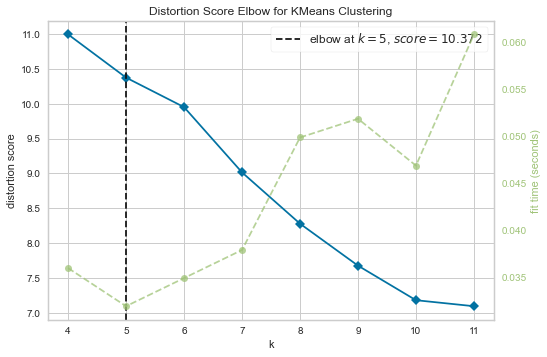

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [94]:
! pip install yellowbrick

# Import ElbowVisualizer
from yellowbrick.cluster import KElbowVisualizer

model = KMeans()
# k is range of number of clusters.
visualizer = KElbowVisualizer(model, k=(4,12), metric='distortion', timings=True)

visualizer.fit(bay_grouped_clustering)        # Fit the data to the visualizer
visualizer.show()  
# Finalize and render the figure

###  We can clearly see how the silhouette score peaks up at k=5

#### Run _k_-means to cluster the zip codes into 5 clusters.

In [58]:
# set number of clusters
kclusters = 5

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(bay_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([1, 1, 1, 1, 1, 1, 0, 1, 1, 1])

In [59]:
len(kmeans.labels_)

174

In [169]:
# add clustering labels
zipcodes_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)
zipcodes_venues_sorted.head()

ValueError: cannot insert Cluster Labels, already exists

In [61]:
bay_data.head()

,ZipCode,City,Latitude,Longitude,Area,Population,People / Sq. Mile
0,94558,"Napa, California",38.489789,-122.270110,1.231326e+10,63932,155.68
1,94533,"Fairfield, California",38.287136,-122.027110,9.917861e+08,77666,2290.55
2,95620,"Dixon, California",38.392821,-121.799917,7.236950e+09,18510,91.81
3,95476,"Sonoma, California",38.254850,-122.461799,3.001414e+09,34310,309.44
4,94559,"Napa, California",38.232389,-122.324944,1.194302e+09,26891,800.91


In [62]:
# merge bay_grouped with bay_data to add latitude/longitude for each zip code
bay_merged = bay_data.join(zipcodes_venues_sorted.set_index('ZipCode'), on='ZipCode',how='inner')

bay_merged # check the last columns!

,ZipCode,City,Latitude,Longitude,Area,Population,People / Sq. Mile,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,94558,"Napa, California",38.489789,-122.270110,1.231326e+10,63932,155.68,4,Bar,Winery,Zoo Exhibit,Fish & Chips Shop,Eye Doctor,Fabric Shop,Factory,Falafel Restaurant,Farm,Farmers Market
1,94533,"Fairfield, California",38.287136,-122.027110,9.917861e+08,77666,2290.55,1,Fast Food Restaurant,Pizza Place,Pharmacy,Gym / Fitness Center,Salon / Barbershop,Grocery Store,Video Store,Park,Mexican Restaurant,Big Box Store
3,95476,"Sonoma, California",38.254850,-122.461799,3.001414e+09,34310,309.44,1,Garden Center,Event Space,Miscellaneous Shop,Wine Shop,Farm,Beer Garden,Fish & Chips Shop,Fabric Shop,Factory,Falafel Restaurant
4,94559,"Napa, California",38.232389,-122.324944,1.194302e+09,26891,800.91,1,Vineyard,Winery,Food,Harbor / Marina,Boat or Ferry,Zoo Exhibit,Filipino Restaurant,Field,Fast Food Restaurant,Farmers Market
5,94954,"Petaluma, California",38.235021,-122.557332,2.006544e+09,35400,540.11,1,Farm,Vineyard,Zoo Exhibit,Event Service,Exhibit,Eye Doctor,Fabric Shop,Factory,Falafel Restaurant,Farmers Market
7,94535,"Travis Afb, California",38.265899,-121.939461,3.029397e+08,9966,1131.27,1,Sandwich Place,Fast Food Restaurant,Hotel,Fried Chicken Joint,Pizza Place,Grocery Store,Hot Dog Joint,Bakery,Japanese Restaurant,Movie Theater
8,94949,"Novato, California",38.067204,-122.524004,4.316054e+08,13360,1000.61,1,American Restaurant,Hotel,Coffee Shop,Sandwich Place,Restaurant,Pizza Place,Park,Mexican Restaurant,Gas Station,Trail
9,94945,"Novato, California",38.135897,-122.563683,7.537170e+08,16423,517.29,1,Trail,Airport,Lawyer,Hotel,Cafeteria,Health & Beauty Service,State / Provincial Park,Entertainment Service,Wine Shop,Nature Preserve
11,94591,"Vallejo, California",38.105733,-122.186338,4.845067e+08,51659,2283.94,1,Golf Course,Park,Fried Chicken Joint,Pizza Place,American Restaurant,Liquor Store,Boat or Ferry,Pharmacy,Fabric Shop,Factory
12,94510,"Benicia, California",38.113533,-122.119260,8.567942e+08,25573,784.88,3,Beach,Zoo Exhibit,Fish Market,Fabric Shop,Factory,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field


In [63]:
len(bay_merged)

174

### visualize the resulting clusters

In [64]:
# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(bay_merged['Latitude'], bay_merged['Longitude'], bay_merged['City'], bay_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters




## Examine Clusters

In [65]:
bay_merged.sort_values(by='Cluster Labels')

,ZipCode,City,Latitude,Longitude,Area,Population,People / Sq. Mile,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
148,94539,"Fremont, California",37.516791,-121.899117,8.240462e+08,46910,1436.36,0,Trail,Athletics & Sports,Mountain,Café,Fish Market,Fabric Shop,Factory,Falafel Restaurant,Farm,Farmers Market
21,94585,"Suisun City, California",38.197907,-122.017258,6.221110e+09,39260,201.47,0,Trail,Farm,Zoo Exhibit,Fish & Chips Shop,Eye Doctor,Fabric Shop,Factory,Falafel Restaurant,Farmers Market,Fast Food Restaurant
67,94970,"Stinson Beach, California",37.921137,-122.657562,3.265383e+07,772,132.23,0,Trail,Beach,Lake,Fish & Chips Shop,Eye Doctor,Fabric Shop,Factory,Falafel Restaurant,Farm,Farmers Market
37,94930,"Fairfax, California",37.971751,-122.611873,7.954870e+08,8476,681.30,0,Trail,Park,Lake,Golf Course,Food,Steakhouse,Home Service,Filipino Restaurant,Field,Fast Food Restaurant
75,94507,"Alamo, California",37.855717,-121.994813,3.979002e+08,15186,838.71,0,Park,Trail,Track,Pizza Place,Business Service,High School,Tennis Court,Golf Course,Zoo Exhibit,Eye Doctor
144,94555,"Fremont, California",37.555473,-122.080312,3.345923e+08,33863,2836.78,0,Intersection,Trail,Baseball Field,Park,Construction & Landscaping,Gym / Fitness Center,Eye Doctor,Fabric Shop,Factory,Falafel Restaurant
101,94619,"Oakland, California",37.787186,-122.146330,1.306599e+08,24501,2427.47,0,Trail,Park,Community College,Farmers Market,Bus Stop,Pizza Place,Deli / Bodega,Intersection,Convenience Store,Gym
63,94941,"Mill Valley, California",37.901371,-122.572024,7.378374e+08,28718,1400.79,0,Trail,Park,Other Repair Shop,Playground,Scenic Lookout,Café,Bookstore,Hotel,Non-Profit,National Park
77,94965,"Sausalito, California",37.848641,-122.515692,3.181866e+08,11206,739.52,0,Trail,Park,Seafood Restaurant,Scenic Lookout,Food Court,Field,Event Space,Exhibit,Eye Doctor,Fabric Shop
135,94044,"Pacifica, California",37.573633,-122.455167,4.027890e+08,38869,889.83,0,Trail,Park,Gym / Fitness Center,Gym,Tourist Information Center,Home Service,Field,Exhibit,Eye Doctor,Fabric Shop


### Count the number of zipcodes in every cluster labels.

In [66]:
cluster_counts=bay_merged['Cluster Labels'].value_counts()
cluster_counts=pd.DataFrame(cluster_counts).reset_index()
cluster_counts.rename(columns={'Cluster Labels':'Counts', 'index':'Cluster Labels'}, inplace=True)
cluster_counts.sort_values(by='Cluster Labels')
cluster_counts.style.set_caption('Bay Area Zipcodes Clustering')

,Cluster Labels,Counts
0,1,156
1,0,15
2,4,1
3,3,1
4,2,1


##  Analyze the Chinese restaurants in bay area. 

In [67]:
bay_chinese=bay_venues[bay_venues['Venue Category']=='Chinese Restaurant']
bay_chinese=pd.merge(bay_merged[['ZipCode','Cluster Labels']],bay_chinese, on='ZipCode', how='inner' )
bay_chinese['Number of Chinese Restaurant']=1
bay_chinese.sort_values(by=['Cluster Labels'], inplace=True)
bay_chinese.head()

,ZipCode,Cluster Labels,City,City Latitude,City Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,Number of Chinese Restaurant
36,94904,0,"Greenbrae, California",37.946617,-122.563571,Kin Wah Restaurant,37.955091,-122.547151,Chinese Restaurant,1
0,94533,1,"Fairfield, California",38.287136,-122.027110,Panda Express,38.289116,-122.033499,Chinese Restaurant,1
119,94580,1,"San Lorenzo, California",37.676249,-122.132415,Peking Garden,37.680314,-122.126749,Chinese Restaurant,1
120,94580,1,"San Lorenzo, California",37.676249,-122.132415,Sisi's Hong Kong Cafe,37.673101,-122.122282,Chinese Restaurant,1
121,94541,1,"Hayward, California",37.674002,-122.076796,Chef's Experience China Bistro,37.675750,-122.081788,Chinese Restaurant,1


In [68]:
bay_chinese['ZipCode'].shape

(186,)

In [69]:
bay_chinese['ZipCode'].unique().shape

(74,)

### Virtualize the distribution of all Chinese restaurants in bay area.

In [103]:
!conda install -c conda-forge folium=0.12.0 --yes 
import folium # map rendering library

map_chinese = folium.Map(location=[latitude, longitude], zoom_start=11)

lgd_txt = '<span style=\\"color: {col};\\">{txt}</span>'

fg1 = folium.FeatureGroup(name= lgd_txt.format( txt= 'Chinese restaurant', col= 'blue'))
for lat, lng, label in zip(bay_data['Latitude'], bay_data['Longitude'], bay_data['City']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(fg1)  
    
fg1.add_to(map_chinese)

fg2 = folium.FeatureGroup(name= lgd_txt.format( txt= 'Zip Code', col= 'red'))
for lat, lng, label in zip(bay_chinese['Venue Latitude'], bay_chinese['Venue Longitude'], bay_chinese['City']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='red',
        fill=False,
        fill_color='#3186cc',
        #fill_color='red',
        fill_opacity=0.7,
        parse_html=False).add_to(fg2)  
    
fg2.add_to(map_chinese)

folium.map.LayerControl('topright', collapsed=False).add_to(map_chinese)
map_clusters.save(outfile= "map_chinese.html")
map_chinese


## Virtualize the distribution of Chinese restaurants by zipcode, the numbers of the restaurants  are shown by marker sizes.

In [71]:
bay_chinese_data=bay_chinese[['ZipCode','Number of Chinese Restaurant']].groupby('ZipCode').sum().reset_index()
bay_chinese_data=pd.merge(bay_chinese_data, bay_data, on='ZipCode')
bay_chinese_data=pd.merge(bay_merged[['ZipCode','Cluster Labels']],bay_chinese_data, on='ZipCode' )
bay_chinese_data.sort_values(by='Cluster Labels', inplace=True)
bay_chinese_data

,ZipCode,Cluster Labels,Number of Chinese Restaurant,City,Latitude,Longitude,Area,Population,People / Sq. Mile
14,94904,0,1,"Greenbrae, California",37.946617,-122.563571,1.247604e+08,11999,1820.59
0,94533,1,1,"Fairfield, California",38.287136,-122.027110,9.917861e+08,77666,2290.55
52,94579,1,1,"San Leandro, California",37.687264,-122.157280,8.376751e+07,19802,6403.48
51,94014,1,3,"Daly City, California",37.691561,-122.445202,1.815553e+08,47451,7788.15
50,94005,1,2,"Brisbane, California",37.684694,-122.407120,1.323574e+08,3615,680.80
49,94578,1,3,"San Leandro, California",37.704384,-122.126703,1.253342e+08,36565,9709.74
48,94568,1,3,"Dublin, California",37.713926,-121.928425,2.198047e+08,29633,2573.26
47,94134,1,2,"San Francisco, California",37.721052,-122.413573,6.751601e+07,40134,16769.18
46,94112,1,3,"San Francisco, California",37.720498,-122.443119,9.222602e+07,73104,22097.56
45,94132,1,1,"San Francisco, California",37.722302,-122.491129,1.127272e+08,26291,6472.81


In [132]:
bay_chinese_counts=pd.DataFrame(bay_chinese_data['Cluster Labels'].value_counts()).reset_index()
bay_chinese_counts.rename(columns={'Cluster Labels':'Counts', 'index':'Cluster Labels'}, inplace=True)
bay_chinese_counts.sort_values(by='Cluster Labels')
bay_chinese_counts.style.set_caption('Clusters of the zip codes with Chinese Restaurants')

,Cluster Labels,Counts
0,1,73
1,0,1


In [116]:
map_chinese = folium.Map(location=[latitude, longitude], zoom_start=11)
# add markers to map
for lat, lng, label, rad in zip(bay_chinese_data['Latitude'], bay_chinese_data['Longitude'], bay_chinese_data['ZipCode'], bay_chinese_data['Number of Chinese Restaurant']):
    if rad>=8:
        label = folium.Popup(str(label), parse_html=True,show=True)
    else:
        label = folium.Popup(str(label), parse_html=True,show=False)
    folium.CircleMarker(
        [lat, lng],
        radius=2*rad,
        popup=label,
        color='red',
        fill=False,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_chinese)  
    
map_chinese

## Analyze the relation of Chinese restaurants distribution with population.

In [135]:
zip_chinese=bay_onehot[['ZipCode','Chinese Restaurant']].groupby('ZipCode').sum()
zip_chinese=zip_chinese.rename(columns={'Chinese Restaurant':'Number of Chinese Restaurant'})
bay_chinese_population=pd.merge(zip_chinese, population, on='ZipCode')
bay_chinese_population.head()

,ZipCode,Number of Chinese Restaurant,City,Latitude,Longitude,Area,People / Sq. Mile,Total Population,White,Black or African American,American Indian and Alaska Native,Asian Indian,Chinese,Filipino,Japanese,Korean,Vietnamese,Other Asian,Native Hawaiian,Guamanian or Chamorro,Samoan,Other Pacific Islander,Some Other Race
0,94002,1,"Belmont, California",37.509366,-122.306132,1.632100e+08,3405.90,25992.0,17555.0,424.0,72.0,979.0,2234.0,791.0,461.0,204.0,107.0,392.0,30.0,19.0,13.0,137.0,988.0
1,94005,2,"Brisbane, California",37.684694,-122.407120,1.323574e+08,680.80,4282.0,2578.0,80.0,21.0,52.0,456.0,335.0,64.0,45.0,45.0,87.0,6.0,0.0,21.0,14.0,182.0
2,94010,0,"Burlingame, California",37.570280,-122.365778,3.590162e+08,2860.17,40737.0,27523.0,403.0,82.0,768.0,5056.0,1437.0,646.0,531.0,127.0,565.0,29.0,8.0,18.0,107.0,1562.0
3,94014,3,"Daly City, California",37.691561,-122.445202,1.815553e+08,7788.15,47014.0,11703.0,1625.0,276.0,191.0,6408.0,14610.0,188.0,144.0,461.0,1014.0,29.0,19.0,234.0,95.0,7618.0
4,94015,0,"Daly City, California",37.680844,-122.481310,1.594835e+08,11003.66,60927.0,14622.0,2155.0,169.0,476.0,9846.0,20792.0,461.0,510.0,617.0,3262.0,34.0,29.0,270.0,148.0,4565.0


In [193]:
bay_chinese_population

,ZipCode,Number of Chinese Restaurant,City,Latitude,Longitude,Area,People / Sq. Mile,Total Population,White,Black or African American,American Indian and Alaska Native,Asian Indian,Chinese,Filipino,Japanese,Korean,Vietnamese,Other Asian,Native Hawaiian,Guamanian or Chamorro,Samoan,Other Pacific Islander,Some Other Race
0,94002,1,"Belmont, California",37.509366,-122.306132,1.632100e+08,3405.90,25992.0,17555.0,424.0,72.0,979.0,2234.0,791.0,461.0,204.0,107.0,392.0,30.0,19.0,13.0,137.0,988.0
1,94005,2,"Brisbane, California",37.684694,-122.407120,1.323574e+08,680.80,4282.0,2578.0,80.0,21.0,52.0,456.0,335.0,64.0,45.0,45.0,87.0,6.0,0.0,21.0,14.0,182.0
2,94010,0,"Burlingame, California",37.570280,-122.365778,3.590162e+08,2860.17,40737.0,27523.0,403.0,82.0,768.0,5056.0,1437.0,646.0,531.0,127.0,565.0,29.0,8.0,18.0,107.0,1562.0
3,94014,3,"Daly City, California",37.691561,-122.445202,1.815553e+08,7788.15,47014.0,11703.0,1625.0,276.0,191.0,6408.0,14610.0,188.0,144.0,461.0,1014.0,29.0,19.0,234.0,95.0,7618.0
4,94015,0,"Daly City, California",37.680844,-122.481310,1.594835e+08,11003.66,60927.0,14622.0,2155.0,169.0,476.0,9846.0,20792.0,461.0,510.0,617.0,3262.0,34.0,29.0,270.0,148.0,4565.0
5,94019,0,"Half Moon Bay, California",37.455670,-122.407992,2.041954e+09,405.21,18424.0,14142.0,138.0,126.0,55.0,169.0,233.0,127.0,26.0,31.0,70.0,0.0,5.0,2.0,7.0,2599.0
6,94022,0,"Los Altos, California",37.349546,-122.134356,4.211365e+08,815.41,18500.0,13136.0,96.0,30.0,1019.0,2270.0,101.0,336.0,327.0,91.0,220.0,1.0,10.0,5.0,23.0,117.0
7,94024,0,"Los Altos, California",37.352911,-122.093002,2.966973e+08,3150.93,22385.0,15503.0,110.0,27.0,1311.0,2730.0,147.0,475.0,380.0,182.0,306.0,2.0,3.0,4.0,21.0,168.0
8,94025,0,"Menlo Park, California",37.449551,-122.183762,3.360792e+08,4828.91,40526.0,28775.0,1659.0,188.0,760.0,1606.0,364.0,463.0,327.0,97.0,306.0,10.0,8.0,62.0,428.0,3610.0
9,94027,0,"Atherton, California",37.454924,-122.203168,1.400977e+08,1428.72,7089.0,5705.0,75.0,7.0,157.0,414.0,91.0,89.0,63.0,40.0,83.0,20.0,4.0,2.0,19.0,98.0


### Plot the number of Chinese restaurants vs. total population per zipcode.

Text(0.5, 1.0, 'Number of Chinese Restaurants v.s. Total Population of a Zip Code')

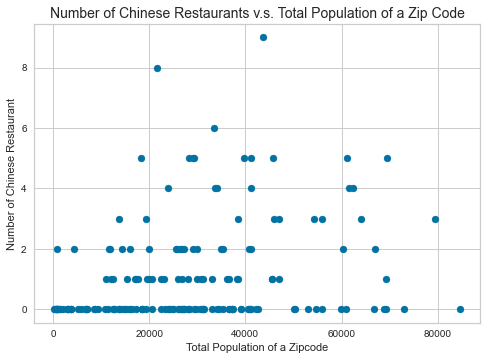

In [147]:
plt.scatter(x=bay_chinese_population['Total Population'], y=bay_chinese_population['Number of Chinese Restaurant'])
plt.xlabel('Total Population of a Zipcode')
plt.ylabel('Number of Chinese Restaurants')
plt.title('Number of Chinese Restaurants v.s. Total Population of a Zip Code', {'fontsize': 14})

Text(0.5, 1.0, 'Number of Chinese Restaurants v.s. People / Sq. Mile of a Zip Code')

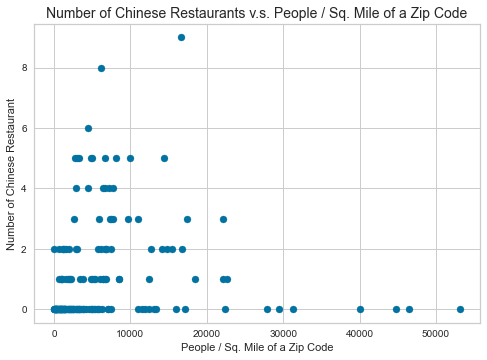

In [148]:
plt.scatter(x=bay_chinese_population['People / Sq. Mile'], y=bay_chinese_population['Number of Chinese Restaurant'])
plt.xlabel('People / Sq. Mile of a Zip Code')
plt.ylabel('Number of Chinese Restaurants')
plt.title('Number of Chinese Restaurants v.s. People / Sq. Mile of a Zip Code',{'fontsize': 14})

Text(0.5, 1.0, 'Number of Chinese Restaurants v.s. Average Population of the Zip Codes')

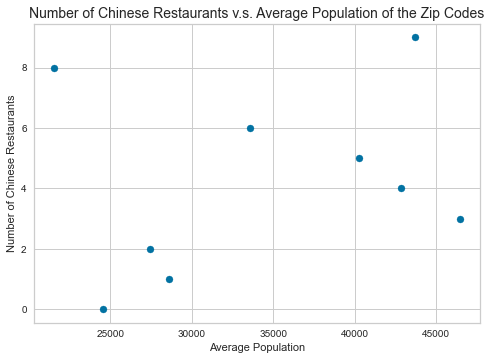

In [192]:
bay_chinese_mean=bay_chinese_population[['Number of Chinese Restaurant','Total Population']].groupby('Number of Chinese Restaurant').mean().reset_index()
plt.scatter(x=bay_chinese_mean['Total Population'], y=bay_chinese_mean['Number of Chinese Restaurant'])
#sns.regplot(x='Total Population',y='Number of Chinese Restaurant',data=bay_chinese_mean)
plt.xlabel('Average Population')
plt.ylabel('Number of Chinese Restaurants')
plt.title('Number of Chinese Restaurants v.s. Average Population of the Zip Codes', {'fontsize': 14})

### Plot the number of Chinese restaurants vs. Chinese population per zipcode.

Text(0.5, 1.0, 'Number of Chinese Restaurants v.s. Chinese Population of a zip code')

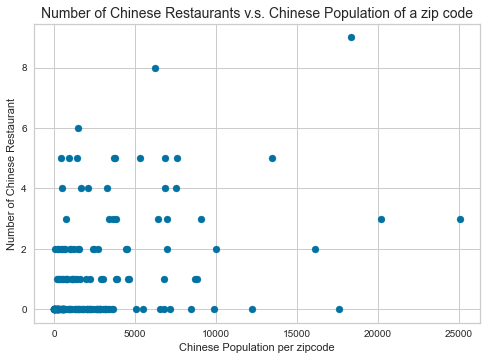

In [198]:
plt.scatter(x=bay_chinese_population['Chinese'], y=bay_chinese_population['Number of Chinese Restaurant'])
plt.xlabel('Chinese Population per zipcode')
plt.ylabel('Number of Chinese Restaurant')
plt.title('Number of Chinese Restaurants v.s. Chinese Population of a zip code', {'fontsize': 14})

Text(0.5, 1.0, 'Number of Chinese Restaurants v.s. Average Population of the Zip Codes')

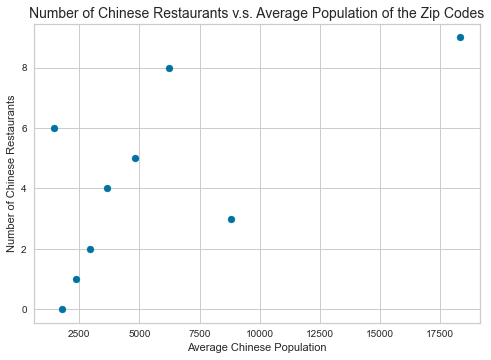

In [195]:
bay_chinese_mean=bay_chinese_population[['Number of Chinese Restaurant','Chinese']].groupby('Number of Chinese Restaurant').mean().reset_index()
plt.scatter(x=bay_chinese_mean['Chinese'], y=bay_chinese_mean['Number of Chinese Restaurant'])
#sns.regplot(x='Chinese',y='Number of Chinese Restaurant',data=bay_chinese_mean)
plt.xlabel('Average Chinese Population')
plt.ylabel('Number of Chinese Restaurants')
plt.title('Number of Chinese Restaurants v.s. Average Population of the Zip Codes', {'fontsize': 14})

### Plot the number of other venue category vs. race population per zipcode.

<ipython-input-76-b6dabc584396>:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


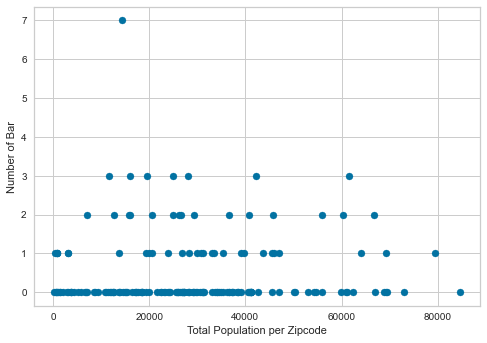

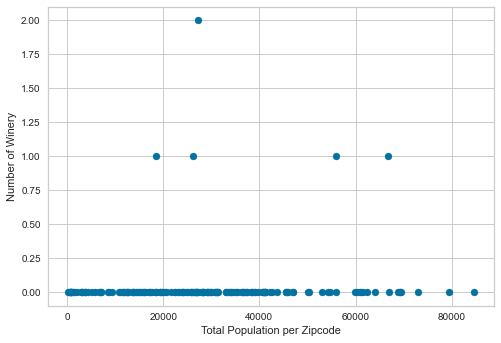

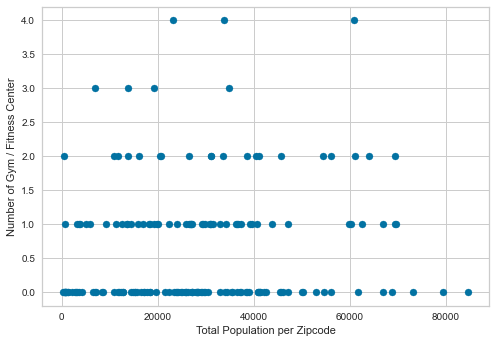

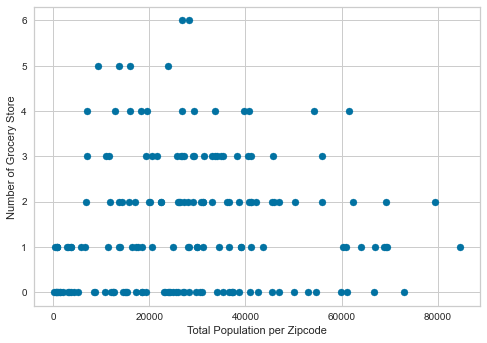

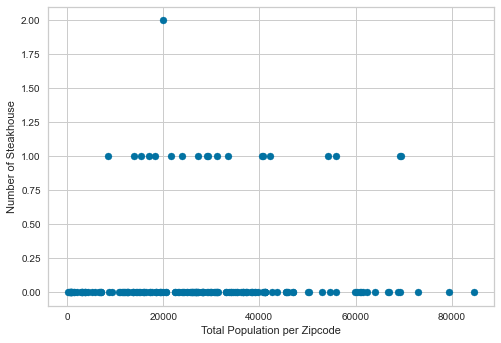

...

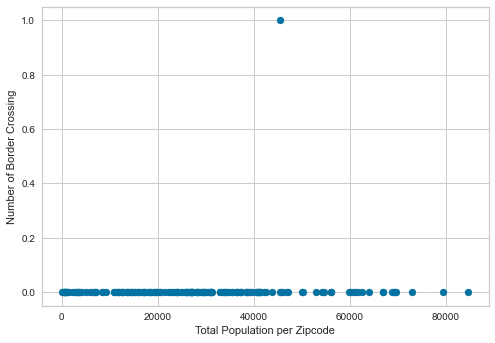

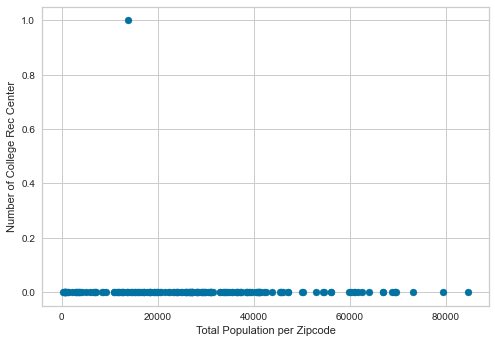

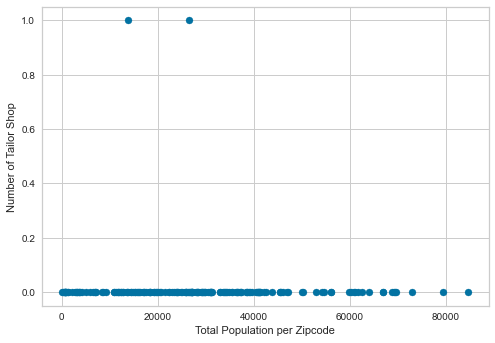

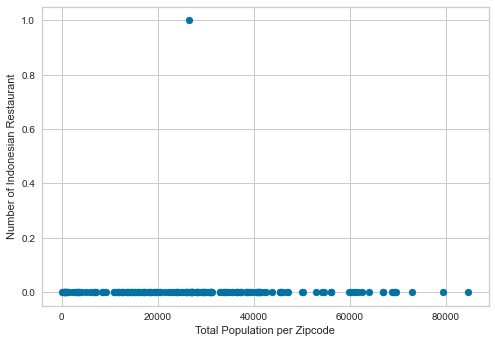

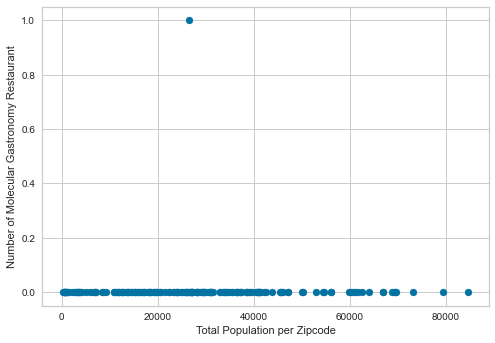

In [76]:
for category in bay_venues['Venue Category'].unique():
    category=category
    race='Total Population'
    number_of_venue='Number of '+category
    zip_venue=bay_onehot[['ZipCode',category]].groupby('ZipCode').sum()
    zip_venue=zip_venue.rename(columns={category:number_of_venue})
    bay_venue_population=pd.merge(zip_venue, population, on='ZipCode')
    bay_venue_population
    
    plt.figure()
    plt.scatter(x=bay_venue_population[race], y=bay_venue_population[number_of_venue])
    plt.xlabel(race + ' per Zipcode')
    plt.ylabel(number_of_venue)    

### Plot the number of Chinese restaurants vs. different race population per zipcode.

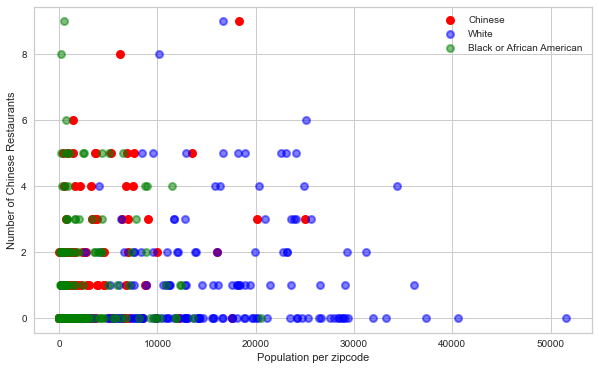

In [202]:
race1='Chinese'
race2='White'
race3='Black or African American'

plt.figure(figsize=(10,6))
l1=plt.scatter(x=bay_chinese_population[race1], y=bay_chinese_population['Number of Chinese Restaurant'], c='red', alpha=1,linewidths=2)
l2=plt.scatter(x=bay_chinese_population[race2], y=bay_chinese_population['Number of Chinese Restaurant'],c='blue', alpha=0.5,linewidths=2)
l3=plt.scatter(x=bay_chinese_population[race3], y=bay_chinese_population['Number of Chinese Restaurant'],c='green', alpha=0.5,linewidths=2)
plt.legend((l1,l2,l3),(race1,race2,race3))
plt.xlabel('Population per zipcode')
plt.ylabel('Number of Chinese Restaurants')
plt.show()

### Plot different race population per zipcode vs. the number of Chinese restaurants.

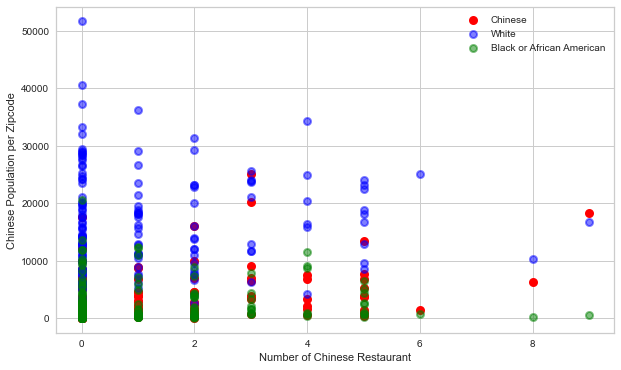

In [78]:
race1='Chinese'
race2='White'
race3='Black or African American'

plt.figure(figsize=(10,6))
l1=plt.scatter(y=bay_chinese_population[race1], x=bay_chinese_population['Number of Chinese Restaurant'], c='red', alpha=1,linewidths=2)
l2=plt.scatter(y=bay_chinese_population[race2], x=bay_chinese_population['Number of Chinese Restaurant'],c='blue', alpha=0.5,linewidths=2)
l3=plt.scatter(y=bay_chinese_population[race3], x=bay_chinese_population['Number of Chinese Restaurant'],c='green', alpha=0.5,linewidths=2)
plt.legend((l1,l2,l3),(race1,race2,race3))
plt.xlabel('Number of Chinese Restaurant')
plt.ylabel('Chinese Population per Zipcode')
plt.show()

## boxplot to show the statistics relation between the number of Chinese restaurants and the population.

Text(0.5, 1.0, 'Total Population of a zip code v.s.  Number of Chinese Restaurants')

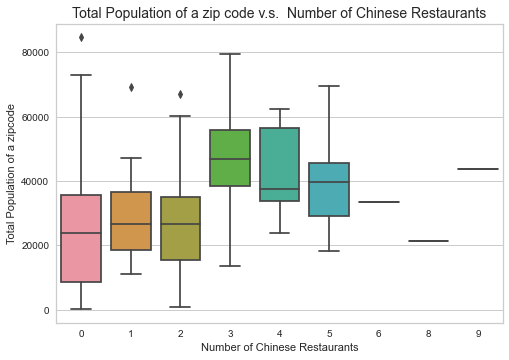

In [205]:
sns.boxplot(y='Total Population', x='Number of Chinese Restaurant', data=bay_chinese_population)

plt.xlabel('Number of Chinese Restaurants')
plt.ylabel('Total Population of a zipcode')
plt.title('Total Population of a zip code v.s.  Number of Chinese Restaurants', {'fontsize': 14})

Text(0.5, 1.0, 'Chinese Population of a zip code v.s.  Number of Chinese Restaurants')

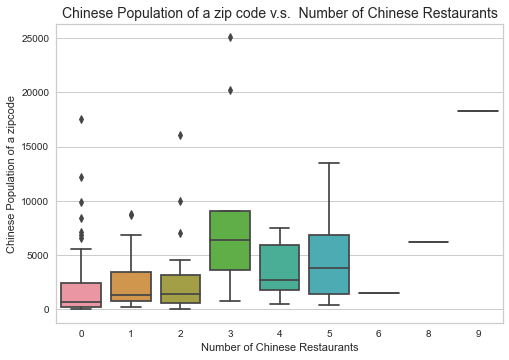

In [206]:
sns.boxplot(y='Chinese', x='Number of Chinese Restaurant', data=bay_chinese_population)
plt.xlabel('Number of Chinese Restaurants')
plt.ylabel('Chinese Population of a zipcode')
plt.title('Chinese Population of a zip code v.s.  Number of Chinese Restaurants', {'fontsize': 14})

Text(0.5, 1.0, 'White Population of a zip code v.s.  Number of Chinese Restaurants')

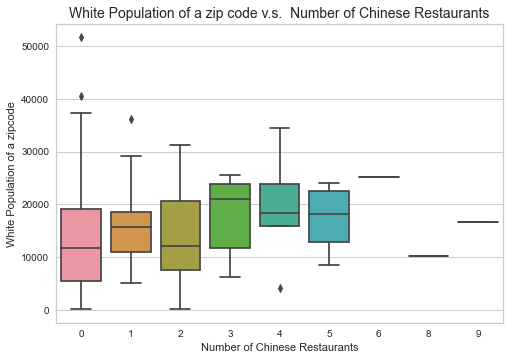

In [207]:
sns.boxplot(y='White', x='Number of Chinese Restaurant', data=bay_chinese_population)

plt.xlabel('Number of Chinese Restaurants')
plt.ylabel('White Population of a zipcode')
plt.title('White Population of a zip code v.s.  Number of Chinese Restaurants', {'fontsize': 14})

Text(0.5, 1.0, 'Black Population of a zip code v.s.  Number of Chinese Restaurants')

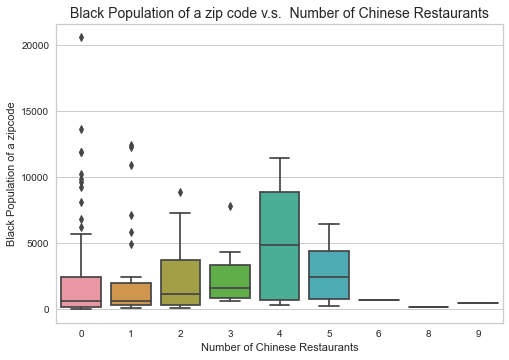

In [208]:
sns.boxplot(y='Black or African American', x='Number of Chinese Restaurant', data=bay_chinese_population)

plt.xlabel('Number of Chinese Restaurants')
plt.ylabel('Black Population of a zipcode')
plt.title('Black Population of a zip code v.s.  Number of Chinese Restaurants', {'fontsize': 14})

Text(0.5, 1.0, 'Korean Population of a zip code v.s.  Number of Chinese Restaurants')

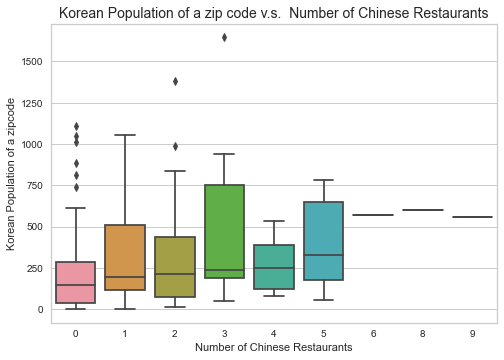

In [210]:
sns.boxplot(y='Korean', x='Number of Chinese Restaurant', data=bay_chinese_population)

plt.xlabel('Number of Chinese Restaurants')
plt.ylabel('Korean Population of a zipcode')
plt.title('Korean Population of a zip code v.s.  Number of Chinese Restaurants', {'fontsize': 14})

## Pearson Correlation to find out the strength of the correlation between the number of Chinese restaurants and the races.

In [83]:
bay_chinese_population

,ZipCode,Number of Chinese Restaurant,City,Latitude,Longitude,Area,People / Sq. Mile,Total Population,White,Black or African American,American Indian and Alaska Native,Asian Indian,Chinese,Filipino,Japanese,Korean,Vietnamese,Other Asian,Native Hawaiian,Guamanian or Chamorro,Samoan,Other Pacific Islander,Some Other Race
0,94002,1,"Belmont, California",37.509366,-122.306132,1.632100e+08,3405.90,25992.0,17555.0,424.0,72.0,979.0,2234.0,791.0,461.0,204.0,107.0,392.0,30.0,19.0,13.0,137.0,988.0
1,94005,2,"Brisbane, California",37.684694,-122.407120,1.323574e+08,680.80,4282.0,2578.0,80.0,21.0,52.0,456.0,335.0,64.0,45.0,45.0,87.0,6.0,0.0,21.0,14.0,182.0
2,94010,0,"Burlingame, California",37.570280,-122.365778,3.590162e+08,2860.17,40737.0,27523.0,403.0,82.0,768.0,5056.0,1437.0,646.0,531.0,127.0,565.0,29.0,8.0,18.0,107.0,1562.0
3,94014,3,"Daly City, California",37.691561,-122.445202,1.815553e+08,7788.15,47014.0,11703.0,1625.0,276.0,191.0,6408.0,14610.0,188.0,144.0,461.0,1014.0,29.0,19.0,234.0,95.0,7618.0
4,94015,0,"Daly City, California",37.680844,-122.481310,1.594835e+08,11003.66,60927.0,14622.0,2155.0,169.0,476.0,9846.0,20792.0,461.0,510.0,617.0,3262.0,34.0,29.0,270.0,148.0,4565.0
5,94019,0,"Half Moon Bay, California",37.455670,-122.407992,2.041954e+09,405.21,18424.0,14142.0,138.0,126.0,55.0,169.0,233.0,127.0,26.0,31.0,70.0,0.0,5.0,2.0,7.0,2599.0
6,94022,0,"Los Altos, California",37.349546,-122.134356,4.211365e+08,815.41,18500.0,13136.0,96.0,30.0,1019.0,2270.0,101.0,336.0,327.0,91.0,220.0,1.0,10.0,5.0,23.0,117.0
7,94024,0,"Los Altos, California",37.352911,-122.093002,2.966973e+08,3150.93,22385.0,15503.0,110.0,27.0,1311.0,2730.0,147.0,475.0,380.0,182.0,306.0,2.0,3.0,4.0,21.0,168.0
8,94025,0,"Menlo Park, California",37.449551,-122.183762,3.360792e+08,4828.91,40526.0,28775.0,1659.0,188.0,760.0,1606.0,364.0,463.0,327.0,97.0,306.0,10.0,8.0,62.0,428.0,3610.0
9,94027,0,"Atherton, California",37.454924,-122.203168,1.400977e+08,1428.72,7089.0,5705.0,75.0,7.0,157.0,414.0,91.0,89.0,63.0,40.0,83.0,20.0,4.0,2.0,19.0,98.0


In [200]:
from scipy import stats
pearson=pd.DataFrame(columns=['Race','Pearson Correlation Coefficient','P-value'])

for race in bay_chinese_population.columns.values[6:]:
    pearson_coef, p_value = stats.pearsonr(x=bay_chinese_population[race],y=bay_chinese_population['Number of Chinese Restaurant'])
    pearson=pearson.append({'Race':race, 'Pearson Correlation Coefficient':pearson_coef,'P-value':p_value}, ignore_index=True)
    
pearson.set_index('Race').sort_values(by='Pearson Correlation Coefficient',ascending=False)

,Pearson Correlation Coefficient,P-value
Race,,
Chinese,0.389104,1.119018e-07
Japanese,0.351877,1.923586e-06
Other Asian,0.287259,1.214346e-04
Total Population,0.273408,2.619307e-04
Korean,0.261904,4.812362e-04
Native Hawaiian,0.234785,1.818263e-03
Samoan,0.184477,1.481648e-02
Asian Indian,0.182008,1.623211e-02
Filipino,0.178221,1.863173e-02


## Define a funtion to get the Pearson Correlation of a venue category on the races.

In [214]:
def pearson_venue(venue_category):
    category=venue_category
    number_of_venue='Number of '+category
    zip_venue=bay_onehot[['ZipCode',category]].groupby('ZipCode').sum()
    zip_venue=zip_venue.rename(columns={category:number_of_venue})
    bay_venue_population=pd.merge(zip_venue, population, on='ZipCode')

    pearson_venue=pd.DataFrame(columns=['Race','Pearson Correlation Coefficient','P-value'])

    for race in bay_venue_population.columns.values[6:]:
        pearson_coef, p_value = stats.pearsonr(x=bay_venue_population[race],y=bay_venue_population[number_of_venue])
        pearson_venue=pearson_venue.append({'Race':race, 'Pearson Correlation Coefficient':pearson_coef,'P-value':p_value},
                                           ignore_index=True)

    return pearson_venue.set_index('Race').sort_values(by='Pearson Correlation Coefficient',ascending=False)

In [215]:
pearson_venue('Sushi Restaurant')

,Pearson Correlation Coefficient,P-value
Race,,
People / Sq. Mile,0.415609,1.178337e-08
Korean,0.298676,6.249937e-05
Japanese,0.247750,9.806270e-04
White,0.207973,5.891678e-03
Chinese,0.116964,1.242871e-01
Total Population,0.084955,2.650319e-01
Native Hawaiian,0.042915,5.739340e-01
Asian Indian,0.037249,6.255639e-01
Other Asian,0.030367,6.907960e-01


In [216]:
pearson_venue('Filipino Restaurant')

,Pearson Correlation Coefficient,P-value
Race,,
Filipino,0.580696,4.500352e-17
Samoan,0.405788,2.776230e-08
Other Asian,0.365924,6.856615e-07
Total Population,0.305026,4.267049e-05
Chinese,0.263257,4.486449e-04
Some Other Race,0.256705,6.279537e-04
Other Pacific Islander,0.244671,1.138862e-03
Native Hawaiian,0.240814,1.370010e-03
American Indian and Alaska Native,0.237188,1.625644e-03


In [87]:
bay_venues['Venue Category'].unique()

array(['Bar', 'Winery', 'Gym / Fitness Center', 'Grocery Store',
       'Steakhouse', 'Japanese Restaurant', 'Taco Place', 'Golf Course',
       'Thai Restaurant', 'Pizza Place', 'Mexican Restaurant',
       'Hardware Store', 'Brewery', 'Pharmacy', 'Frozen Yogurt Shop',
       'Chinese Restaurant', 'Sandwich Place', 'Indian Restaurant',
       'Salon / Barbershop', 'Coffee Shop', 'Bank', 'Video Store',
       'Big Box Store', 'Fast Food Restaurant', 'Halal Restaurant',
       'Fried Chicken Joint', 'Discount Store', 'American Restaurant',
       'Gas Station', 'Optical Shop', 'Convenience Store', 'Gym', 'Park',
       'Rental Service', 'Credit Union', 'Playground',
       'Light Rail Station', 'Mattress Store', 'Beer Garden',
       'Event Space', 'Farm', 'Garden Center', 'Miscellaneous Shop',
       'Wine Shop', 'Vineyard', 'Boat or Ferry', 'Harbor / Marina',
       'Food', 'Department Store', 'Bowling Alley', 'Supplement Shop',
       'Hotel', 'Ice Cream Shop', 'Bakery', 'Hot Dog Joi

### We can get mostly correlated race for each venue category and the Pearson correlation.

In [88]:
pearson_bay=pd.DataFrame(index=['Most correlated Race', 'Pearson Correlation Coefficient','P-value'],columns=list(bay_venues['Venue Category'].unique()))

for venue_category in bay_venues['Venue Category'].unique():
    
    pearson_bay[venue_category]=[pearson_venue(venue_category).index[0], pearson_venue(venue_category)['Pearson Correlation Coefficient'][0],pearson_venue(venue_category)['P-value'][0]]
    
pearson_bay

,Bar,Winery,Gym / Fitness Center,Grocery Store,Steakhouse,Japanese Restaurant,Taco Place,Golf Course,Thai Restaurant,Pizza Place,Mexican Restaurant,Hardware Store,Brewery,Pharmacy,Frozen Yogurt Shop,Chinese Restaurant,Sandwich Place,Indian Restaurant,Salon / Barbershop,Coffee Shop,Bank,Video Store,Big Box Store,Fast Food Restaurant,Halal Restaurant,Fried Chicken Joint,Discount Store,American Restaurant,Gas Station,Optical Shop,Convenience Store,Gym,Park,Rental Service,Credit Union,Playground,Light Rail Station,Mattress Store,Beer Garden,Event Space,Farm,Garden Center,Miscellaneous Shop,Wine Shop,Vineyard,Boat or Ferry,Harbor / Marina,Food,Department Store,Bowling Alley,Supplement Shop,Hotel,Ice Cream Shop,Bakery,Hot Dog Joint,History Museum,Food Court,Rental Car Location,Automotive Shop,Korean Restaurant,Shopping Mall,Movie Theater,Burger Joint,Trail,Sushi Restaurant,Animal Shelter,Pet Store,Juice Bar,Pool,Supermarket,Restaurant,Art Gallery,Shipping Store,Italian Restaurant,New American Restaurant,Lounge,Dive Bar,Skate Park,Mobile Phone Shop,Sporting Goods Shop,Donut Shop,Tea Room,Café,Hobby Shop,Persian Restaurant,Mediterranean Restaurant,Yoga Studio,Theater,Business Service,Deli / Bodega,State / Provincial Park,Airport,Entertainment Service,Lawyer,Nature Preserve,Cafeteria,Health & Beauty Service,Platform,Liquor Store,Beach,Island,Farmers Market,Breakfast Spot,Music Venue,Southern / Soul Food Restaurant,Seafood Restaurant,Post Office,Church,Food Truck,Bridge,Government Building,Antique Shop,Flower Shop,ATM,Thrift / Vintage Store,Record Shop,Baseball Field,Filipino Restaurant,Massage Studio,Vietnamese Restaurant,Lake,Dog Run,Electronics Store,Disc Golf,BBQ Joint,Dessert Shop,Sports Bar,Motel,Clothing Store,Storage Facility,Bus Station,Canal,Furniture / Home Store,Indie Movie Theater,Office,Athletics & Sports,Home Service,Nail Salon,Other Repair Shop,Scenic Lookout,Museum,Accessories Store,Gift Shop,City,Dance Studio,Street Food Gathering,Spanish Restaurant,Beer Bar,Art Museum,Dumpling Restaurant,Concert Hall,Jazz Club,Wine Bar,Marijuana Dispensary,Motorcycle Shop,Opera House,Bubble Tea Shop,Butcher,Burmese Restaurant,French Restaurant,Cocktail Bar,Pedestrian Plaza,Plaza,Boutique,Men's Store,Arts & Crafts Store,Performing Arts Venue,Boxing Gym,Souvlaki Shop,Tennis Court,Spa,Bagel Shop,Latin American Restaurant,Climbing Gym,Intersection,Metro Station,Gym Pool,Community Center,Comfort Food Restaurant,Andhra Restaurant,Lingerie Store,Candy Store,Cosmetics Shop,Shoe Store,Travel Agency,Kids Store,Road,Market,Shop & Service,Gymnastics Gym,Field,Train Station,Nightclub,Asian Restaurant,Laundromat,Toll Plaza,Track Stadium,Golf Driving Range,Fruit & Vegetable Store,Airport Service,Diner,Airport Lounge,Greek Restaurant,Parking,Health Food Store,Taxi Stand,Bookstore,Campground,Basketball Court,Martial Arts School,Buffet,Cajun / Creole Restaurant,Multiplex,Rock Club,Food Stand,Construction & Landscaping,Financial or Legal Service,Smoothie Shop,Cheese Shop,Bike Shop,Wings Joint,Salad Place,Monument / Landmark,Sculpture Garden,Hawaiian Restaurant,Cycle Studio,Beer Store,Trade School,Perfume Shop,Ramen Restaurant,National Park,Brazilian Restaurant,North Indian Restaurant,Paper / Office Supplies Store,Video Game Store,Peruvian Restaurant,Garden,Stables,River,Recreation Center,Burrito Place,Noodle House,Dim Sum Restaurant,Eye Doctor,Snack Place,Theme Park,Other Great Outdoors,Cambodian Restaurant,Vegetarian / Vegan Restaurant,Flea Market,Gastropub,Moroccan Restaurant,Fish & Chips Shop,College Bookstore,Music Store,Warehouse Store,Comic Shop,Dam,Pub,Historic Site,Spiritual Center,Toy / Game Store,Pet Service,Tattoo Parlor,Medical Center,Roller Rink,Gourmet Shop,Cupcake Shop,Kitchen Supply Store,Women's Store,Fondue Restaurant,Volleyball Court,Bike Trail,Food & Drink Shop,Fabric Shop,Ski Shop,Tapas Restaurant,Turkish Restaurant,Middle Eastern Restaurant,Russian Restaurant,Fountain,Outdoor Sculpture,Pier,Exhibit,Chocolate Shop,Argentinian Restau

In [212]:
pearson_bay=pd.DataFrame(columns=['Most correlated Population', 'Pearson Correlation Coefficient','P-value','Least correlated Population'],index=list(bay_venues['Venue Category'].unique()).sort())

for venue_category in bay_venues['Venue Category'].unique():
    
    pearson_bay.loc[venue_category]=[pearson_venue(venue_category).index[0], pearson_venue(venue_category)['Pearson Correlation Coefficient'][0],pearson_venue(venue_category)['P-value'][0],pearson_venue(venue_category).index[14]]
    
pearson_bay.sort_values(by='Most correlated Population')

,Most correlated Population,Pearson Correlation Coefficient,P-value,Least correlated Population
Cambodian Restaurant,American Indian and Alaska Native,0.233371,1.941169e-03,Asian Indian
Argentinian Restaurant,American Indian and Alaska Native,0.021159,7.816880e-01,Other Asian
Performing Arts Venue,American Indian and Alaska Native,0.144479,5.716299e-02,Other Pacific Islander
Jewish Restaurant,American Indian and Alaska Native,0.255452,6.689998e-04,Other Pacific Islander
South American Restaurant,American Indian and Alaska Native,0.255452,6.689998e-04,Other Pacific Islander
Adult Boutique,American Indian and Alaska Native,0.103691,1.733273e-01,Other Pacific Islander
Sausage Shop,American Indian and Alaska Native,0.255452,6.689998e-04,Other Pacific Islander
Pedestrian Plaza,American Indian and Alaska Native,0.028580,7.081382e-01,White
Cocktail Bar,American Indian and Alaska Native,0.118128,1.205612e-01,Other Pacific Islander
Opera House,American Indian and Alaska Native,0.137317,7.078548e-02,Other Pacific Islander
